# 771763 - Understanding Artificial Intelligence

## Assessment coding component 2 
***

# Component 2 - Convolutional Neural Network


In [1]:
#importing the required libraries
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

#Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import Dropout, Dense, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D

In [4]:
#Initializing data
data_dir = "vehicles"

#defining data parameters
batch_size = 32
img_height = 180
img_width = 180

#transforming image data into numeric matrices
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_ds.class_names
print(class_names)

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']


In [5]:
# Using tensorflow’s AUTOTUNE to configure dataset
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])


#Standardize the data
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixels values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

num_classes = 4

0.00032671762 1.0


###  Adapting the previously defined CNN and training it on the vehicles dataset

### Max pooling

In [4]:
# reconstructing the model from the workshop identically.

model = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)       

In [5]:
%%time

epochs = 10
history = model.fit(
  train_ds,
  validation_data=val_ds,
    epochs=epochs
)

#save model to use later
model.save("model")


Epoch 1/10
108/108 [==============================] - 99s 901ms/step - loss: 1.3516 - accuracy: 0.4052 - val_loss: 1.0900 - val_accuracy: 0.5458
Epoch 2/10
108/108 [==============================] - 85s 788ms/step - loss: 1.0186 - accuracy: 0.5774 - val_loss: 1.1051 - val_accuracy: 0.5098
Epoch 3/10
108/108 [==============================] - 86s 800ms/step - loss: 0.9214 - accuracy: 0.6385 - val_loss: 1.0199 - val_accuracy: 0.5794
Epoch 4/10
108/108 [==============================] - 86s 793ms/step - loss: 0.8436 - accuracy: 0.6596 - val_loss: 0.9877 - val_accuracy: 0.6014
Epoch 5/10
108/108 [==============================] - 87s 801ms/step - loss: 0.6880 - accuracy: 0.7337 - val_loss: 1.0251 - val_accuracy: 0.5921
Epoch 6/10
108/108 [==============================] - 85s 787ms/step - loss: 0.5363 - accuracy: 0.8003 - val_loss: 1.1442 - val_accuracy: 0.5921
Epoch 7/10
108/108 [==============================] - 85s 790ms/step - loss: 0.3911 - accuracy: 0.8663 - val_loss: 1.3827 - val_ac

#### Visualizing the performance metrics of the model

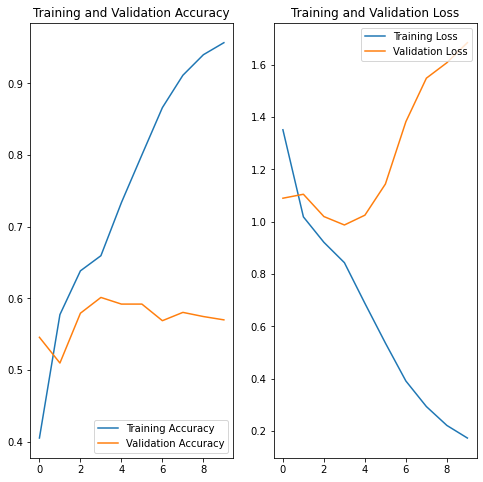

In [6]:
epochs = 10
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)


# Define a function to plot the metrics of a model's performance
def plot_acc_loss():
    plt.figure(figsize=(8, 8))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()
    
#visualize model's performance metrics
plot_acc_loss()

## training the model for 30 epochs

In [7]:
%%time

epochs = 30
history = model.fit(
  train_ds,
  validation_data=val_ds,
    epochs=epochs
)


Epoch 1/30
108/108 [==============================] - 88s 819ms/step - loss: 0.1510 - accuracy: 0.9589 - val_loss: 1.8929 - val_accuracy: 0.5446
Epoch 2/30
108/108 [==============================] - 94s 871ms/step - loss: 0.1408 - accuracy: 0.9650 - val_loss: 1.7793 - val_accuracy: 0.5608
Epoch 3/30
108/108 [==============================] - 95s 884ms/step - loss: 0.1239 - accuracy: 0.9658 - val_loss: 1.9139 - val_accuracy: 0.5481
Epoch 4/30
108/108 [==============================] - 91s 847ms/step - loss: 0.1129 - accuracy: 0.9687 - val_loss: 1.9795 - val_accuracy: 0.5643
Epoch 5/30
108/108 [==============================] - 94s 873ms/step - loss: 0.1084 - accuracy: 0.9690 - val_loss: 1.8116 - val_accuracy: 0.5574
Epoch 6/30
108/108 [==============================] - 84s 775ms/step - loss: 0.1008 - accuracy: 0.9656 - val_loss: 2.0618 - val_accuracy: 0.5469
Epoch 7/30
108/108 [==============================] - 86s 793ms/step - loss: 0.0973 - accuracy: 0.9682 - val_loss: 1.8560 - val_ac

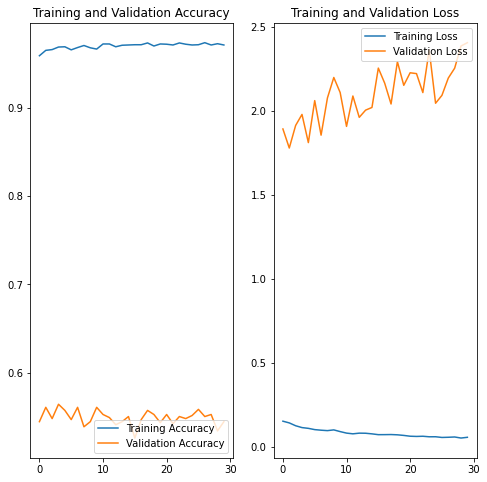

In [8]:
epochs = 30
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)
#visualize model's performance metrics
plot_acc_loss()

### Average pooling

In [43]:
model1 = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.AveragePooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.AveragePooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.AveragePooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model1.summary()


Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_7 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 average_pooling2d_6 (Averag  (None, 90, 90, 16)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_17 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 average_pooling2d_7 (Averag  (None, 45, 45, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_18 (Conv2D)          (None, 45, 45, 64)      

In [44]:
%%time

epochs = 10
history = model1.fit(
  train_ds,
  validation_data=val_ds,
    epochs=epochs
)

#save model to use later
model1.save("model1")


Epoch 1/10
108/108 [==============================] - 102s 914ms/step - loss: 1.1872 - accuracy: 0.4692 - val_loss: 1.0428 - val_accuracy: 0.5689
Epoch 2/10
108/108 [==============================] - 78s 716ms/step - loss: 1.0104 - accuracy: 0.5818 - val_loss: 0.9957 - val_accuracy: 0.5979
Epoch 3/10
108/108 [==============================] - 79s 727ms/step - loss: 0.9051 - accuracy: 0.6414 - val_loss: 0.9743 - val_accuracy: 0.5910
Epoch 4/10
108/108 [==============================] - 80s 740ms/step - loss: 0.7990 - accuracy: 0.6891 - val_loss: 0.9692 - val_accuracy: 0.6188
Epoch 5/10
108/108 [==============================] - 78s 720ms/step - loss: 0.6707 - accuracy: 0.7415 - val_loss: 1.0857 - val_accuracy: 0.5921
Epoch 6/10
108/108 [==============================] - 78s 720ms/step - loss: 0.5617 - accuracy: 0.7858 - val_loss: 1.1174 - val_accuracy: 0.5921
Epoch 7/10
108/108 [==============================] - 79s 734ms/step - loss: 0.4162 - accuracy: 0.8501 - val_loss: 1.2176 - val_a

#### Visualizing the performance metrics of the model

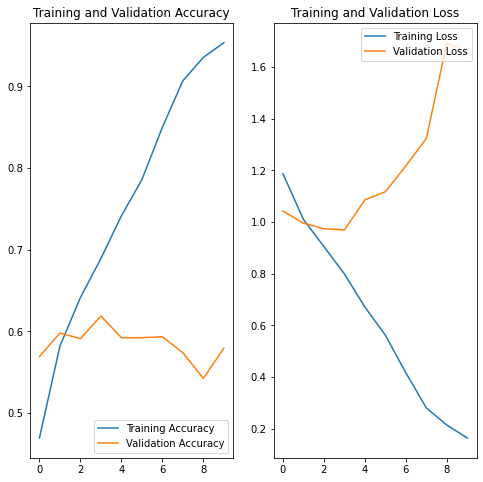

In [49]:
epochs = 10
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)


#visualize model's performance metrics

plot_acc_loss()

### Training a deeper network

In [62]:
model2 = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3))
])
model2.add(Conv2D(16, 3, padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
           
model2.add(Conv2D(32, 3, padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Conv2D(32, 3, padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Conv2D(64, 3, padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Conv2D(64, 3, padding='same', activation='relu'))
model2.add(Dropout(0.2))
           
# Fully connected layer
model2.add(Flatten())
model2.add(Dense(512))
model2.add(Dense(num_classes, activation='softmax'))
  

model2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model2.summary()


Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_13 (Rescaling)    (None, 180, 180, 3)       0         
                                                                 
 conv2d_45 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_46 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_47 (Conv2D)          (None, 45, 45, 32)      

In [63]:
%%time

history = model2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=10
)

Epoch 1/10
108/108 [==============================] - 89s 814ms/step - loss: 1.2096 - accuracy: 0.4368 - val_loss: 1.1730 - val_accuracy: 0.5191
Epoch 2/10
108/108 [==============================] - 90s 830ms/step - loss: 1.0644 - accuracy: 0.5543 - val_loss: 0.9942 - val_accuracy: 0.5863
Epoch 3/10
108/108 [==============================] - 87s 805ms/step - loss: 0.9902 - accuracy: 0.5855 - val_loss: 0.9678 - val_accuracy: 0.6141
Epoch 4/10
108/108 [==============================] - 86s 797ms/step - loss: 0.9397 - accuracy: 0.6229 - val_loss: 0.9577 - val_accuracy: 0.6234
Epoch 5/10
108/108 [==============================] - 88s 815ms/step - loss: 0.9063 - accuracy: 0.6362 - val_loss: 0.9053 - val_accuracy: 0.6385
Epoch 6/10
108/108 [==============================] - 86s 799ms/step - loss: 0.8575 - accuracy: 0.6648 - val_loss: 0.9568 - val_accuracy: 0.6338
Epoch 7/10
108/108 [==============================] - 87s 802ms/step - loss: 0.8237 - accuracy: 0.6758 - val_loss: 0.8892 - val_ac

#### Visualizing the performance metrics of the model

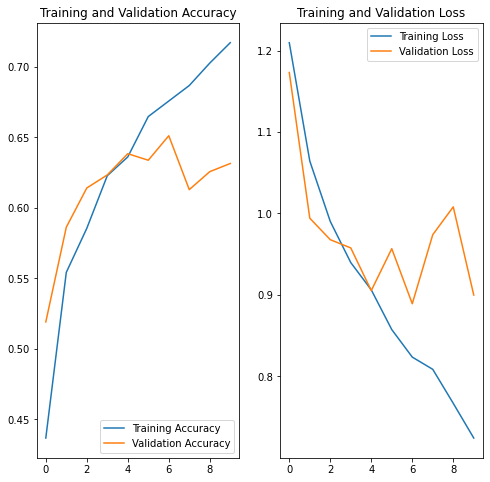

In [65]:
epochs = 10
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)



#visualize model's performance metrics    
plot_acc_loss()

# Evaluating the network

In [6]:
#Initializing data
test_dir = "my_vehicles" #Twenty new images

#defining data parameters
batch_size = 32
img_height = 180
img_width = 180

#transforming image data into numeric matrices
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  test_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = test_ds.class_names
class_names


Found 20 files belonging to 4 classes.


['bus', 'motorcycle', 'plane', 'train']

#### Display images in dataset

(20, 180, 180, 3)
(20,)


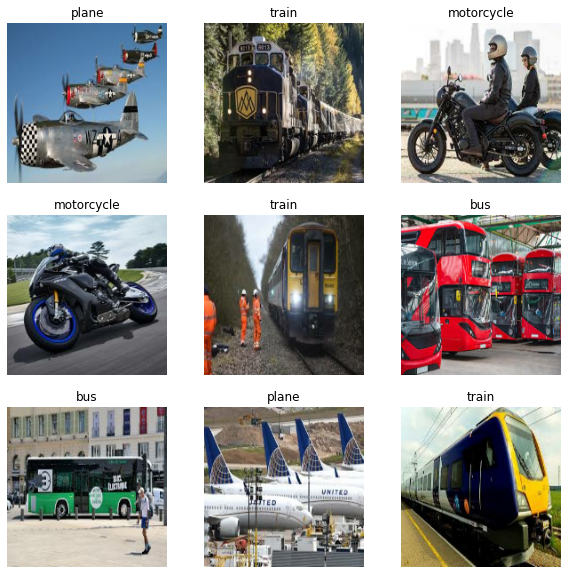

In [71]:
plt.figure(figsize=(10, 10))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in test_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

In [72]:
# Loading saved original model
model = keras.models.load_model('model')

preprocess_input = keras.applications.xception.preprocess_input
x_test, y_test = test_ds.map(lambda x, y: (preprocess_input(x), y)).as_numpy_iterator().next()

x_test.shape, y_test.shape

((20, 180, 180, 3), (20,))

In [73]:
#evaluating the model accuracy
loss, accuracy = model.evaluate(x_test, y_test)
loss, accuracy

1/1 [==============================] - 1s 722ms/step - loss: 2.7096 - accuracy: 0.2500


(2.7095866203308105, 0.25)

In [74]:
#predict test data with model
predictions = model.predict([x_test])

In [75]:
predictions.argmax(1)

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
      dtype=int64)

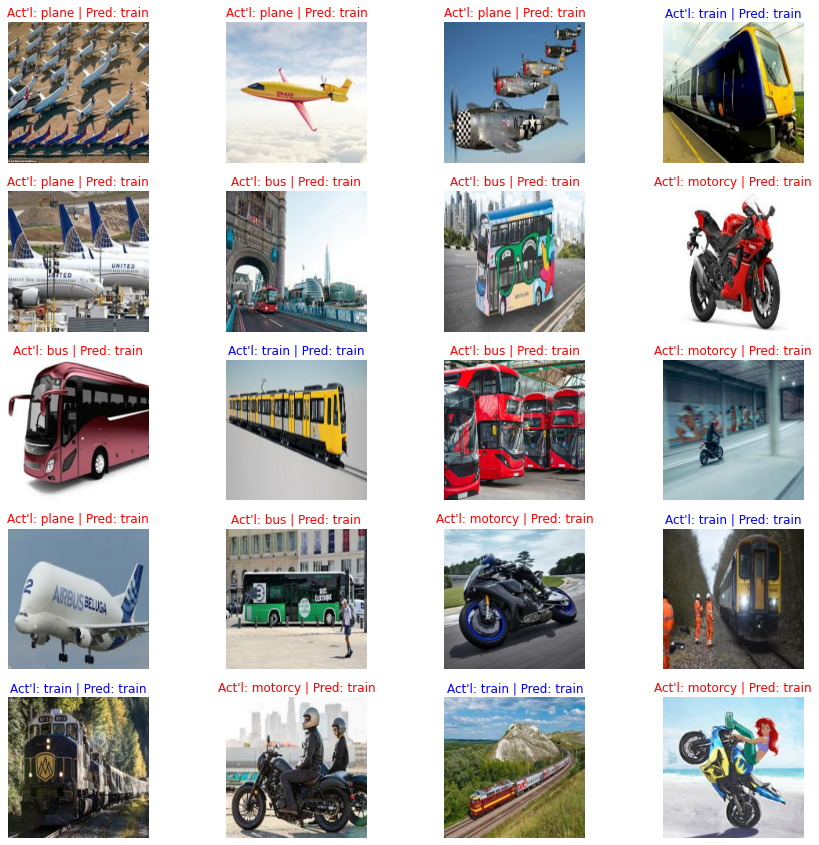

In [76]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(20):
        ax = plt.subplot(5, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        color='blue'
        if labels[i] != predictions.argmax(1)[i]:
            color='red'
        plt.title(f"Act'l: {class_names[labels[i]][:7]} | Pred: {class_names[predictions.argmax(1)[i]][:7]}", color=color)
        plt.axis("off")


plt.show()

### Feature extraction, Fine tuning

In [7]:
#redefine input parameters to match pretrained model's
batch_size = 32
img_height = 160
img_width = 160

train_ds = tf.keras.preprocessing.image_dataset_from_directory(data_dir,
                                                               validation_split=0.2,
                                                               subset='training',
                                                               seed=123,
                                                               image_size=(img_height, img_width), 
                                                               batch_size = batch_size)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(data_dir,
                                                            validation_split=0.2,
                                                            subset="validation",
                                                            seed=123,
                                                            image_size=(img_height,img_width),
                                                            batch_size=batch_size)

class_names=train_ds.class_names
print(class_names)

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']


In [8]:
# Create the base model from the pre_trained model MobileNet V2
IMG_SHAPE = (img_height, img_width) +(3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                              include_top=False,
                                              weights='imagenet')
image_batch, label_batch = next(iter(train_ds))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

# Freezing the convolutional base
base_model.trainable = False
base_model.summary()


(32, 5, 5, 1280)
Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0        

In [9]:
# Generate predictions
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

# Add prediction layer with 3 classes
prediction_layer = tf.keras.layers.Dense(4)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1280)
(32, 4)


In [10]:
# Preprocessing input to match pre-trained model range- rescaling
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

# Adding the rest of the network
inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)

outputs = prediction_layer(x)


In [11]:
model = tf.keras.Model(inputs, outputs)

# compiling the model
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])
model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                             

In [12]:
initial_epochs = 10

loss0, accuracy0 = model.evaluate(val_ds)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

27/27 [==============================] - 35s 950ms/step - loss: 1.7980 - accuracy: 0.2225
initial loss: 1.80
initial accuracy: 0.22


In [13]:
#train the model
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=initial_epochs
)


Epoch 1/10
108/108 [==============================] - 117s 1s/step - loss: 1.6763 - accuracy: 0.3019 - val_loss: 1.1671 - val_accuracy: 0.5226
Epoch 2/10
108/108 [==============================] - 114s 1s/step - loss: 1.2286 - accuracy: 0.4848 - val_loss: 0.8751 - val_accuracy: 0.6744
Epoch 3/10
108/108 [==============================] - 102s 915ms/step - loss: 0.9918 - accuracy: 0.5991 - val_loss: 0.7204 - val_accuracy: 0.7520
Epoch 4/10
108/108 [==============================] - 90s 830ms/step - loss: 0.8941 - accuracy: 0.6559 - val_loss: 0.6420 - val_accuracy: 0.7775
Epoch 5/10
108/108 [==============================] - 91s 830ms/step - loss: 0.8126 - accuracy: 0.6863 - val_loss: 0.5972 - val_accuracy: 0.7914
Epoch 6/10
108/108 [==============================] - 92s 840ms/step - loss: 0.7921 - accuracy: 0.6918 - val_loss: 0.5690 - val_accuracy: 0.7972
Epoch 7/10
108/108 [==============================] - 91s 836ms/step - loss: 0.7573 - accuracy: 0.7117 - val_loss: 0.5502 - val_accur

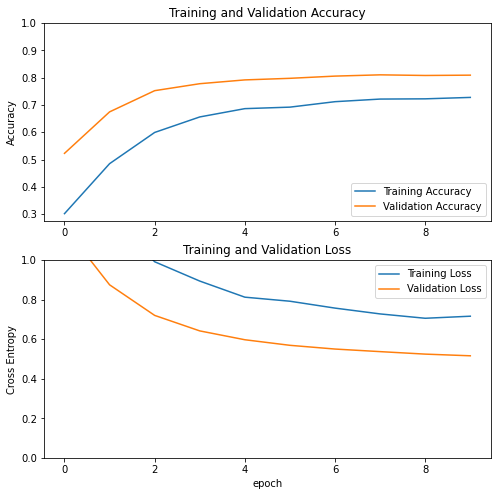

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

#### fine tuning

In [15]:
# unfreeze base model and set bottom layers to trainable
base_model.trainable = True
base_model.summary()

# Preview number of layers in the base model
print('Number of layers in the base model: ', len(base_model.layers))

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

In [16]:
# Define fine-tune start layer 
fine_tune_at = 100

# Freeze all layers before the fine-tune start layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [17]:
# Compiling model
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate/10),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])

#fit model with additional fine tuning epochs
initial_epochs = 10
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs

history_ft = model.fit(train_ds,
                        epochs=total_epochs,
                        initial_epoch = history.epoch[-1],
                        validation_data=val_ds)

Epoch 10/20
108/108 [==============================] - 143s 1s/step - loss: 0.6748 - accuracy: 0.7381 - val_loss: 0.4959 - val_accuracy: 0.8250
Epoch 11/20
108/108 [==============================] - 130s 1s/step - loss: 0.5981 - accuracy: 0.7682 - val_loss: 0.4900 - val_accuracy: 0.8076
Epoch 12/20
108/108 [==============================] - 131s 1s/step - loss: 0.5832 - accuracy: 0.7745 - val_loss: 0.4712 - val_accuracy: 0.8239
Epoch 13/20
108/108 [==============================] - 145s 1s/step - loss: 0.5357 - accuracy: 0.7931 - val_loss: 0.4878 - val_accuracy: 0.8158
Epoch 14/20
108/108 [==============================] - 143s 1s/step - loss: 0.5204 - accuracy: 0.7994 - val_loss: 0.4712 - val_accuracy: 0.8285
Epoch 15/20
108/108 [==============================] - 148s 1s/step - loss: 0.4891 - accuracy: 0.8098 - val_loss: 0.4672 - val_accuracy: 0.8216
Epoch 16/20
108/108 [==============================] - 141s 1s/step - loss: 0.4958 - accuracy: 0.8104 - val_loss: 0.4680 - val_accuracy:

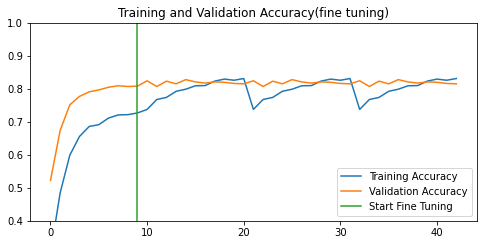

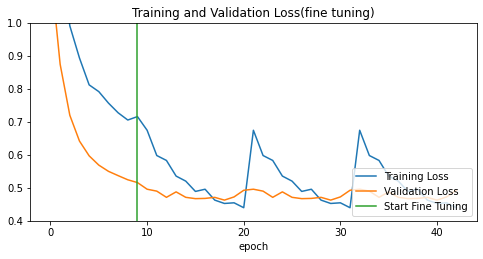

In [20]:
# visualize model training and validation performance

acc += history_ft.history['accuracy']
val_acc += history_ft.history['val_accuracy']

loss += history_ft.history['loss']
val_loss += history_ft.history['val_loss']


plt.figure(figsize=(8, 8))

plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.4, 1])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label = 'Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy(fine tuning)')
plt.show()

plt.figure(figsize=(8, 8))

plt.subplot(2, 1, 1)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0.4, 1])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label = 'Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Loss(fine tuning)')
plt.xlabel('epoch')
plt.show()

In [21]:
# Redefine test data parameters 
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  test_dir,
  seed=123,
  image_size=(160, 160),
  batch_size=batch_size)

Found 20 files belonging to 4 classes.


In [22]:
x_test, y_test = test_ds.as_numpy_iterator().next()

#let's evaluate the fine-tuned model with the test data
loss, accuracy = model.evaluate(x_test, y_test)
loss, accuracy

1/1 [==============================] - 1s 680ms/step - loss: 0.1083 - accuracy: 0.9500


(0.10830457508563995, 0.949999988079071)

In [23]:
#predict test data with fine-tuned model
predictions = model.predict([x_test])

In [24]:
predictions.argmax(1)

array([2, 3, 1, 1, 3, 0, 0, 2, 3, 3, 2, 3, 2, 3, 0, 2, 1, 0, 1, 1],
      dtype=int64)

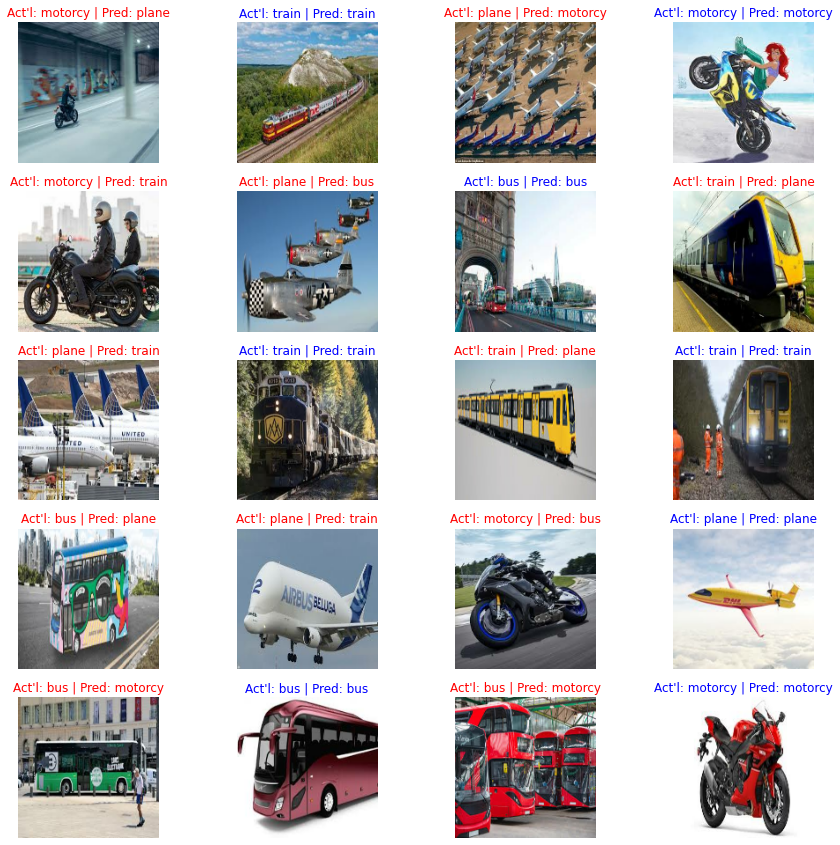

In [25]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(20):
        ax = plt.subplot(5, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        color='blue'
        if labels[i] != predictions.argmax(1)[i]:
            color='red'
        plt.title(f"Act'l: {class_names[labels[i]][:7]} | Pred: {class_names[predictions.argmax(1)[i]][:7]}", color=color)
        plt.axis("off")


plt.show()

### Model explanability

In [26]:
data = (x_test, None)

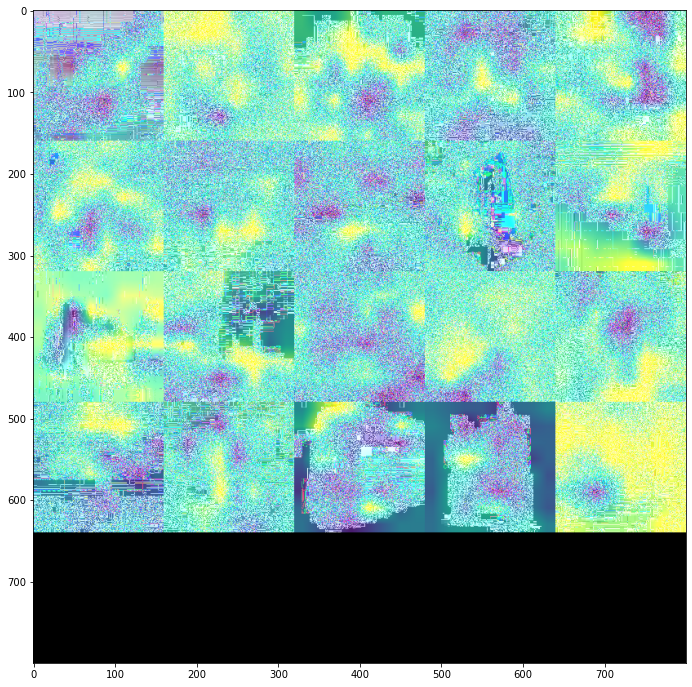

In [27]:
'''Visualize how parts of the image affects neural network's confidence by occluding parts iteratively'''

from tf_explain.core.occlusion_sensitivity import OcclusionSensitivity
# Start explainer
explainer = OcclusionSensitivity()
# Compute Occlusion Sensitivity for patch_size 10
grid = explainer.explain(data, model, 0, 20)

explainer.save(grid, ".", "occ_sense.png")

#plot grid
plt.figure(figsize=(12,12))
plt.imshow(grid.astype("uint8"))
plt.show()

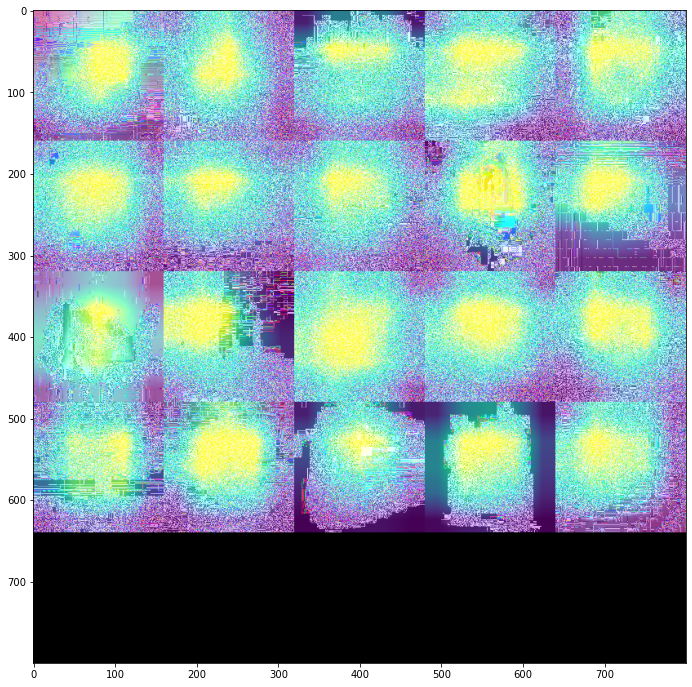

In [29]:
'''Visualize how parts of the image affects neural network's output by looking into the activation maps'''

from tf_explain.core.grad_cam import GradCAM
# Start explainer
explainer = GradCAM()
grid = explainer.explain(data, base_model, 0)  

explainer.save(grid, ".", "grad_cam.png")

#plot grid
plt.figure(figsize=(12,12))
plt.imshow(grid.astype("uint8"))
plt.show()

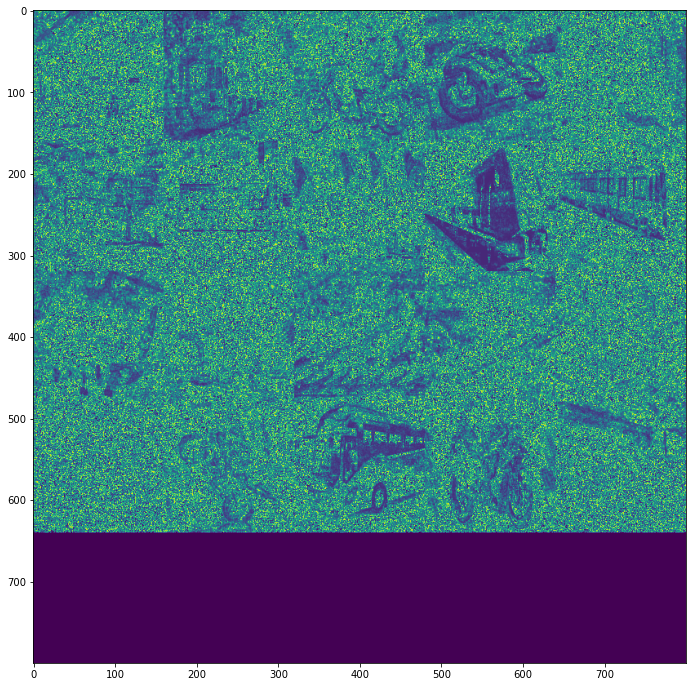

In [31]:

from tf_explain.core.gradients_inputs import GradientsInputs
# Start explainer
explainer = GradientsInputs()
grid = explainer.explain(data, model, 0, )  

explainer.save(grid, ".", "grad_inputs.png")

#plot grid
plt.figure(figsize=(12,12))
plt.imshow(grid.astype("uint8"))
plt.show()

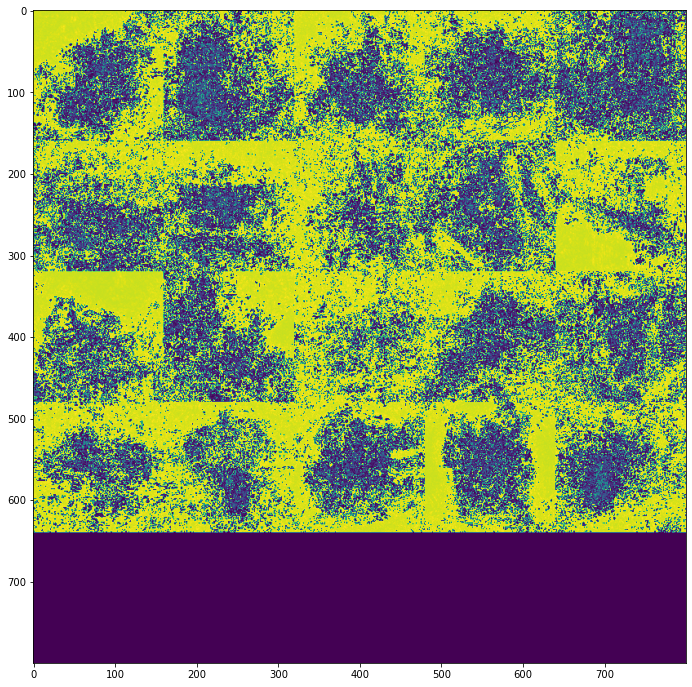

In [32]:
'''Visualize an average of the gradients along the construction of the input towards the decision'''

from tf_explain.core.integrated_gradients import IntegratedGradients
# Start explainer
explainer = IntegratedGradients()
grid = explainer.explain(data, model, 0, n_steps=15)  

explainer.save(grid, ".", "Int_grad.png")

#plot grid
plt.figure(figsize=(12,12))
plt.imshow(grid.astype("uint8"))
plt.show()

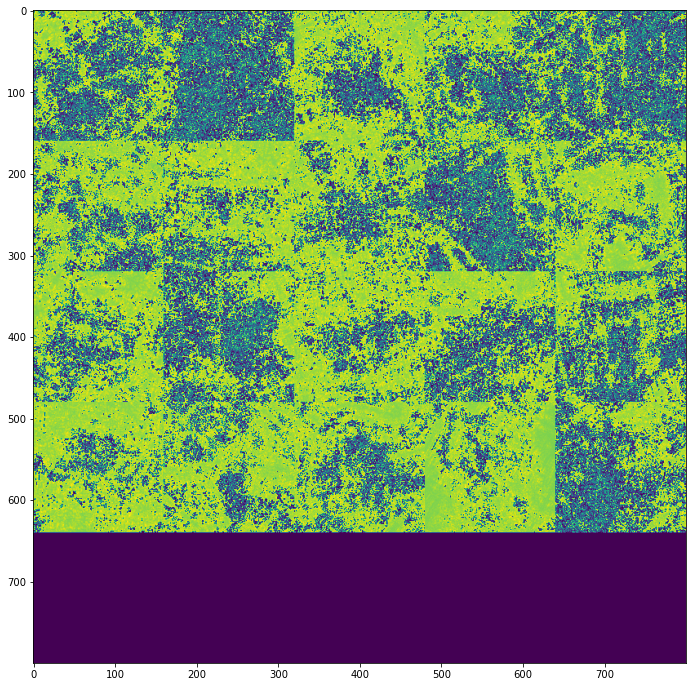

In [34]:
'''Visualize gradients importance on input image'''

from tf_explain.core.vanilla_gradients import VanillaGradients
# Start explainer
explainer = VanillaGradients()
grid = explainer.explain(data, model, 0)  

explainer.save(grid, ".", "van_grad.png")

#plot grid
plt.figure(figsize=(12,12))
plt.imshow(grid.astype("uint8"))
plt.show()

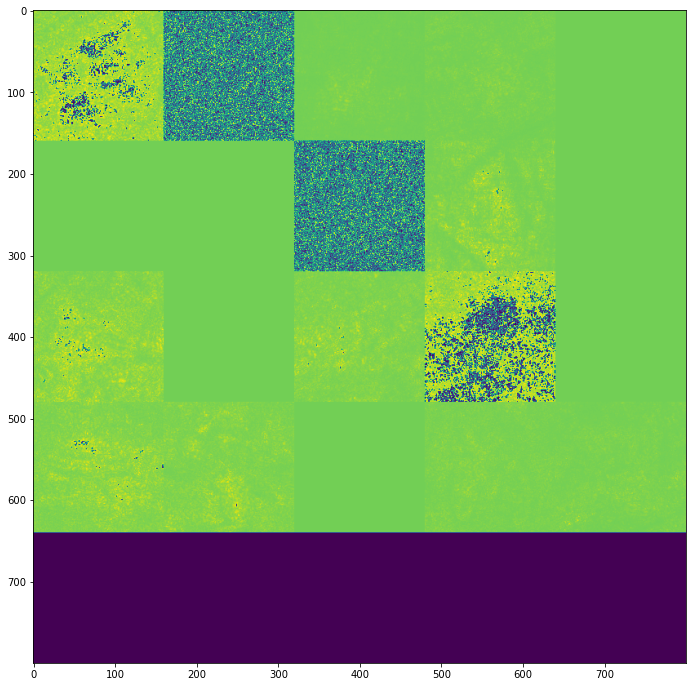

In [36]:
'''Visualize stabilized gradients on the inputs towards the decision'''

from tf_explain.core.smoothgrad import SmoothGrad
# Start explainer
explainer = SmoothGrad()
grid = explainer.explain(data, model, 0, 20, 1.0)  

explainer.save(grid, ".", "smoothgrad.png")

#plot grid
plt.figure(figsize=(12,12))
plt.imshow(grid.astype("uint8"))
plt.show()

## Acknowledgements.
> For code snippets, Documentation, ideas, the following sources:

[Stack overflow][]

[Stack overflow]:https://stackoverflow.com/questions/66358683/how-to-produce-a-grouped-bar-graph-in-seaborn-using-column-names-as-x-axis

[Tensorflow Image Classification][]

[Tensorflow Image Classification]:https://www.tensorflow.org/tutorials/images/classification

[Tensorflow Transfer Learning][]

[Tensorflow Transfer Learning]:https://www.tensorflow.org/tutorials/images/transfer_learning

[Tensorflow Data Augumentation][]

[Tensorflow Data Augumentation]:https://www.tensorflow.org/tutorials/images/data_augmentation

[Tensorflow Train and evaluate][]

[Tensorflow Train and evaluate]:https://www.tensorflow.org/guide/keras/train_and_evaluate


[GitHub- Tensorflow Model explainability][]

[GitHub- Tensorflow Model explainability]:https://github.com/sicara/tf-explain